# Import libraries

In [301]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

# Reading Data

In [302]:
# reading the CSV dataset fil
df = pd.read_csv('../datasets/no1_aggregated/no1_2020_to_2022_aggregated.csv', index_col=0)

# 5 first rows of the dataset
df.head()

,end MTU (UTC),Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5,Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3
start MTU (UTC),,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:00:00,2020-01-01 01:00:00,31.77,31.77,28.45,31.77,28.45,4333.0,4139.0,3016.0,1950.0,...,0.0,1449.0,0.0,391,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2020-01-01 01:00:00,2020-01-01 02:00:00,31.57,31.57,27.90,31.57,27.90,4250.0,4114.0,2945.0,1926.0,...,0.0,1283.0,0.0,348,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2020-01-01 02:00:00,2020-01-01 03:00:00,31.28,31.28,27.52,31.28,27.52,4167.0,4030.0,3032.0,1913.0,...,6.0,962.0,0.0,500,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2020-01-01 03:00:00,2020-01-01 04:00:00,30.72,30.72,27.54,30.72,27.54,4145.0,4032.0,2988.0,1894.0,...,6.0,767.0,0.0,610,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0
2020-01-01 04:00:00,2020-01-01 05:00:00,30.27,30.27,26.55,30.27,26.55,4222.0,4032.0,2848.0,1901.0,...,22.0,642.0,0.0,909,0,4012000.0,24273000.0,5588000.0,11211000.0,2220000.0


57 columns in total and there are 26304 records as expected. all the features are numerical except end MTU (UTC).

In [303]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26304 entries, 2020-01-01 00:00:00 to 2022-12-31 23:00:00
Data columns (total 57 columns):
 #   Column                                                                         Non-Null Count  Dtype  
---  ------                                                                         --------------  -----  
 0   end MTU (UTC)                                                                  26304 non-null  object 
 1   Day-ahead Price [EUR/MWh] BZN|NO1                                              26304 non-null  float64
 2   Day-ahead Price [EUR/MWh] BZN|NO2                                              26304 non-null  float64
 3   Day-ahead Price [EUR/MWh] BZN|NO3                                              26304 non-null  float64
 4   Day-ahead Price [EUR/MWh] BZN|NO5                                              26304 non-null  float64
 5   Day-ahead Price [EUR/MWh] BZN|SE3                                              26304 non-null  float64


In [304]:
# Renaming column names to make it easier to plot and read the graphs
df = df.rename(columns={
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO1':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1' ,
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO2':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2',
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO3':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3',
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|NO5':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5',
    'Stored Energy Value Water Reservoirs and Hydro Storage Plants [MWh] - BZN|SE3':
        'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3'}
)

Removing the 'end MTU' column from the dataframe. We know each row is an hourly collected observation. There is no need to define the start and end time , only start time is necessary.

In [305]:
df.drop('end MTU (UTC)', inplace =True,  axis = 1)

In [306]:
 # Target/dependent column and input/independent columns
df_target_column = df['Day-ahead Price [EUR/MWh] BZN|NO1']

df_without_target = df.drop('Day-ahead Price [EUR/MWh] BZN|NO1', axis = 1)


### Indexing and reindexing , convert the time index to Datetime type from Object type.

In [307]:
# Separate the Datetime column (index), to convert it from Object to Datetime
df = df.reset_index()
# we kan see the 'start MTU (UTC)' as first column, having datatype object
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26304 entries, 0 to 26303
Data columns (total 57 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   start MTU (UTC)                                          26304 non-null  object 
 1   Day-ahead Price [EUR/MWh] BZN|NO1                        26304 non-null  float64
 2   Day-ahead Price [EUR/MWh] BZN|NO2                        26304 non-null  float64
 3   Day-ahead Price [EUR/MWh] BZN|NO3                        26304 non-null  float64
 4   Day-ahead Price [EUR/MWh] BZN|NO5                        26304 non-null  float64
 5   Day-ahead Price [EUR/MWh] BZN|SE3                        26304 non-null  float64
 6   Actual Total Load [MW] - BZN|NO1                         26303 non-null  float64
 7   Actual Total Load [MW] - BZN|NO2                         26303 non-null  float64
 8   Actual Total Load [MW] - B

In [308]:
## Start MTU (UTC) is converted and using set_index() we want to set it as the index as it was before.
df['start MTU (UTC)'] = pd.to_datetime(df['start MTU (UTC)'])

# set 'start MTU (UTC)' as the index
df = df.set_index('start MTU (UTC)', drop = True)

df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26304 entries, 2020-01-01 00:00:00 to 2022-12-31 23:00:00
Data columns (total 56 columns):
 #   Column                                                   Non-Null Count  Dtype  
---  ------                                                   --------------  -----  
 0   Day-ahead Price [EUR/MWh] BZN|NO1                        26304 non-null  float64
 1   Day-ahead Price [EUR/MWh] BZN|NO2                        26304 non-null  float64
 2   Day-ahead Price [EUR/MWh] BZN|NO3                        26304 non-null  float64
 3   Day-ahead Price [EUR/MWh] BZN|NO5                        26304 non-null  float64
 4   Day-ahead Price [EUR/MWh] BZN|SE3                        26304 non-null  float64
 5   Actual Total Load [MW] - BZN|NO1                         26303 non-null  float64
 6   Actual Total Load [MW] - BZN|NO2                         26303 non-null  float64
 7   Actual Total Load [MW] - BZN|NO3                         26303 non-null  floa

# Exploratory data analysis
EDA is quite iterative , we often had to redo parts of analysis after discovering some important information. EDA for this dataset has the following sections:
1. **Structure Investigation** : Shape of dataset , features datatype, number of unique sample for each feature
2. **Quality Investigation** : Duplicate, missing , outliers and unwanted values
3. **Content Investigation** : Feature distribution. Pair-plotting, Feature correlation

## 1. Structure Investigation

In [309]:
# Our dataset is containing 26304 records and 56 features
df.shape

(26304, 56)

In [310]:
# Count number of data types in the dataset, all features are numerical
pd.value_counts(df.dtypes)

float64    53
int64       3
dtype: int64

Using .describe () will help us find big anomalies and get a feeling for distribution of each feature.

- First thing to highlight is that min value for day-ahead prices is negative (-1,97 EUR)
- Another interesting fact is that electricity is almost 300 % cheaper in NO3 compared to other bidding zones. Looking at mean values : NO3=30 EUR , NO1 =92 EUR ,NO2 =98 EUR, NO5 =91 EUR, SE3 =72 EUR.
- 75 % of prices in NO1 is higher than the mean value for prices in NO1. This indicates seasons/timeperiod very high electricity prices.

For further investigation it is easier to look at each feature as a part of a category for example price, import&export, load , generation and water reservoir categories. This part is done after a analysing and studying the dataset as a whole. (After Content Investigation)

In [311]:
df.describe()

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
count,26304.000000,26304.000000,26304.000000,26304.000000,26304.000000,26303.000000,26303.000000,26303.000000,26303.000000,26304.000000,...,26273.000000,26273.000000,26273.000000,26304.000000,26304.000000,2.630400e+04,2.630400e+04,2.630400e+04,2.630400e+04,2.630400e+04
mean,92.089895,98.477096,30.802730,91.868445,72.083614,3943.992891,4179.527354,3137.688020,1901.222028,9771.786915,...,12.051726,1398.770753,12.165836,341.181531,454.188412,3.579091e+06,2.073493e+07,5.731948e+06,9.658894e+06,1.716409e+06
std,102.673358,114.521343,44.767859,102.347340,93.332389,1259.769412,748.668751,485.748914,329.930577,2129.143862,...,39.269949,798.985462,73.549470,497.663086,569.062045,1.582598e+06,6.634143e+06,2.070706e+06,4.128414e+06,3.500652e+05
min,-1.970000,-1.970000,-2.080000,-0.090000,-2.080000,1446.000000,1595.000000,1751.000000,1036.000000,4778.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,4.853340e+05,6.334677e+06,1.691000e+06,1.624537e+06,8.330000e+05
25%,12.530000,12.537500,8.090000,12.617500,16.780000,2922.000000,3574.000000,2748.000000,1647.000000,8110.000000,...,0.000000,827.000000,0.000000,0.000000,0.000000,2.165300e+06,1.671733e+07,4.008874e+06,6.311281e+06,1.546000e+06
50%,54.950000,57.530000,17.625000,54.850000,39.425000,3755.000000,4070.000000,3097.000000,1847.000000,9504.500000,...,0.000000,1402.000000,0.000000,0.000000,67.000000,4.014420e+06,2.026900e+07,6.248826e+06,1.016200e+07,1.733000e+06
75%,140.860000,143.380000,39.980000,140.735000,86.072500,4856.000000,4719.000000,3499.000000,2137.000000,11267.000000,...,0.000000,1935.000000,0.000000,591.000000,895.000000,4.797228e+06,2.427300e+07,7.487797e+06,1.242700e+07,2.019000e+06
max,799.970000,844.000000,590.000000,799.970000,799.970000,7919.000000,7072.000000,5694.000000,4326.000000,16744.000000,...,672.000000,3477.000000,1052.000000,2520.000000,2325.000000,5.919000e+06,3.338800e+07,8.737000e+06,1.645900e+07,2.245000e+06


There are 11 prices equal or below zero EUR, Negative prices occur when supply offered at negative prices is greater than demand. Negative prices are a signal to either increase demand or reduce supply. negative prices occur in the wholesale electricity market and do not occur in the retail electricity market. Most of them are at the end/* of 2020

In [312]:
negative_prices = df[df["Day-ahead Price [EUR/MWh] BZN|NO1"] <= 0]
negative_prices

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
start MTU (UTC),,,,,,,,,,,,,,,,,,,,,
2020-07-06 00:00:00,0.00,0.00,0.00,0.00,0.00,2193.0,2904.0,2242.0,1460.0,6106,...,0.0,0.0,189.0,822,0,5329000.0,29467000.0,7930000.0,13279000.0,2099000.0
2020-07-06 02:00:00,-0.09,-0.09,1.36,-0.09,-0.09,2129.0,3031.0,2142.0,1467.0,6007,...,0.0,0.0,443.0,1197,0,5329000.0,29467000.0,7930000.0,13279000.0,2099000.0
2020-11-02 00:00:00,-0.04,-0.04,1.49,0.94,-0.04,3305.0,3610.0,2559.0,1764.0,7568,...,154.0,0.0,386.0,1587,0,5919000.0,32986000.0,8545000.0,15956000.0,2205000.0
2020-11-02 01:00:00,-0.93,-0.93,1.69,0.83,-0.93,3205.0,3708.0,2554.0,1771.0,7431,...,201.0,0.0,453.0,1417,0,5919000.0,32986000.0,8545000.0,15956000.0,2205000.0
2020-11-02 02:00:00,-1.73,-1.73,1.48,0.81,-1.73,3165.0,3661.0,2483.0,1770.0,7425,...,249.0,0.0,457.0,961,0,5919000.0,32986000.0,8545000.0,15956000.0,2205000.0
2020-11-02 03:00:00,-1.36,-1.36,1.43,0.84,-1.36,3197.0,3787.0,2495.0,1765.0,7505,...,238.0,0.0,459.0,1039,0,5919000.0,32986000.0,8545000.0,15956000.0,2205000.0
2021-10-02 23:00:00,-0.03,-0.03,0.48,34.39,-0.03,2811.0,3526.0,2757.0,1618.0,7066,...,209.0,0.0,687.0,935,0,4536315.0,18520440.0,6446807.0,10119081.0,1805000.0
2021-10-03 00:00:00,-1.02,-1.02,0.21,23.61,-1.02,2802.0,3514.0,2705.0,1601.0,6962,...,250.0,0.0,767.0,654,0,4536315.0,18520440.0,6446807.0,10119081.0,1805000.0
2021-10-03 01:00:00,-1.91,-1.91,0.06,18.26,-1.91,2685.0,3493.0,2797.0,1600.0,6845,...,272.0,0.0,821.0,724,0,4536315.0,18520440.0,6446807.0,10119081.0,1805000.0


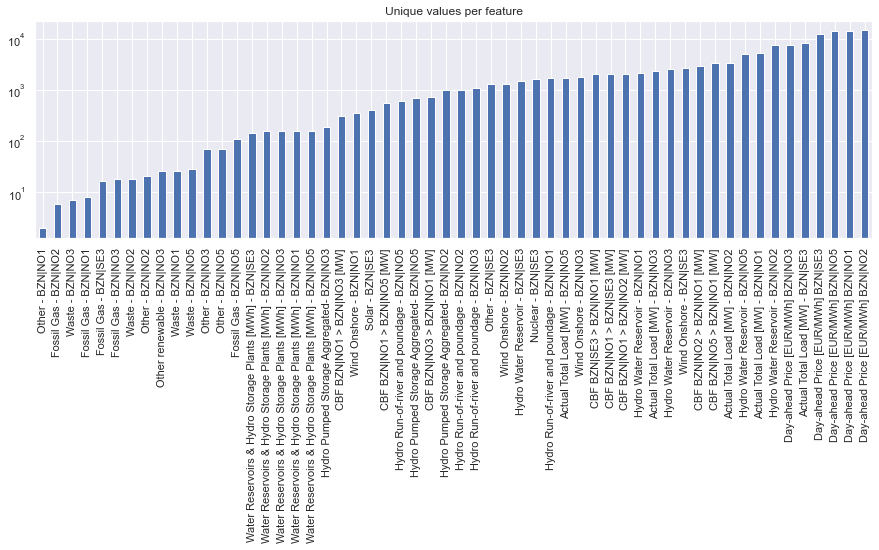

In [313]:
# For each numerical feature compute number of unique entries
unique_values = df.select_dtypes(include="number").nunique().sort_values()

# Plot information with y-axis in log-scale
unique_values.plot.bar(logy=True, figsize=(15, 4), title="Unique values per feature");

It is a good solution to analyse all 56 columns as 5 main categories;

Price :
> Day-ahead Price [EUR/MWh] for NO1, NO2, NO3, NO5, SE3

Load:
> Actual Total Load [MW] for NO1, NO2, NO3, NO5, SE3

Generation per unit type [MW]:
> Fossil Gas
         Nuclear
         Waste
         Wind Onshore
         Hydro Pumped Storage
         Hydro Run-of-river and poundage
         Other

Import and export :
> Import and export between NO1 and NO2,NO3,NO5,SE3 [MW]

Water Reservoirs and Hydro Storage Plants' stored energy value [MW]:
> Hydro Water Reservoir for NO1, NO2, NO3, NO5, SE3

First 5 features from left corner of the plot above have the fewest unique values.
- We start by **'Other - BZN|NO1'**. There is a very low variance and 99.9 % of values are 0's. Rest of values are 1's.
&emsp;
- The percentage of 0's in **'Fossil Gas - BZN|NO2'** is 0.8 and the percentage of 4's in 'Fossil Gas - BZN|NO2' is 0.17 . There is a very low variance
&emsp;
- The percentage of 0's in **'Waste - BZN|NO3'** is 0.34. The percentage of values under 6 MW in 'Waste - BZN|NO3' is 0.84
&emsp;
- The percentage of 0's in **'Fossil Gas - BZN|NO1'** is 0.83, by plotting 'Fossil Gas - BZN|NO1' we understand generation is 0 after July 2020. Since data is not consistent and can not be used for our model , we shall drop 'Fossil Gas - BZN|NO1'.
&emsp;
- The percentage of 0's in 'Fossil Gas - BZN|SE3' is 0.99, after plotting the feature over 3 years , we understand that there are no generation in 2020 and 2021, only in 2022.


#### Other - BZN|NO1

In [314]:
# Examine how often specific values occur in a column: (low variance)
distinct_values_Other_NO1 =df['Other - BZN|NO1'].value_counts()
distinct_values_Other_NO1

0.0    26280
1.0       24
Name: Other - BZN|NO1, dtype: int64

In [315]:
# The percentage of 0's in 'Other - BZN|NO1'
df['Other - BZN|NO1'].where(df['Other - BZN|NO1'] == 0).count()/ df.shape[0]

0.9990875912408759

#### Fossil Gas - BZN|NO2

In [316]:
# Examine how often specific values occur in a column
distinct_values_gas_NO1 =df['Fossil Gas - BZN|NO2'].value_counts()
distinct_values_gas_NO1

0.0    21093
4.0     4517
3.0      551
5.0      129
2.0        7
1.0        1
Name: Fossil Gas - BZN|NO2, dtype: int64

In [317]:
# The percentage of 0's in 'Fossil Gas - BZN|NO2' is 0.8
# The percentage of 4's in 'Fossil Gas - BZN|NO2' is 0.17
df['Fossil Gas - BZN|NO2'].where(df['Fossil Gas - BZN|NO2'] == 0).count()/ df.shape[0]
df['Fossil Gas - BZN|NO2'].where(df['Fossil Gas - BZN|NO2'] == 4).count()/ df.shape[0]


0.1717229318734793

#### 'Waste - BZN|NO3’
Electricity generation values under 6 MW represents very negligible production, mean value for daily load NO1 is 39000 MW. Therefore, values under 6MW are very unlikely to indicate price changes or be useful for our model.

In [318]:
# The percentage of 0's in 'Waste - BZN|NO3' is 0.34
df['Waste - BZN|NO3'].where(df['Waste - BZN|NO3'] == 0).count()/ df.shape[0]
# The percentage of values under 6 MW in 'Waste - BZN|NO3' is 0.84
df['Waste - BZN|NO3'].where(df['Waste - BZN|NO3'] < 6).count()/ df.shape[0]

0.8419631995133819

In [319]:
distinct_values_waste_N03 =df['Waste - BZN|NO3'].value_counts()
distinct_values_waste_N03

0.0    9173
6.0    4152
5.0    3405
4.0    2854
1.0    2545
2.0    2130
3.0    2040
Name: Waste - BZN|NO3, dtype: int64

#### Fossil Gas - BZN|NO

In [320]:
# The percentage of 0's in 'Fossil Gas - BZN|NO1' is 0.83
df['Fossil Gas - BZN|NO1'].where(df['Fossil Gas - BZN|NO1'] == 0).count()/ df.shape[0]

0.8329151459854015

In [321]:
distinct_values_gas_NO1 =df['Fossil Gas - BZN|NO1'].value_counts()
distinct_values_gas_NO1

0.0     21909
22.0     2611
25.0     1530
23.0      153
13.0       48
12.0       24
20.0       13
24.0       11
Name: Fossil Gas - BZN|NO1, dtype: int64

Generation is 0 after July 2020, cannot be used for our model.

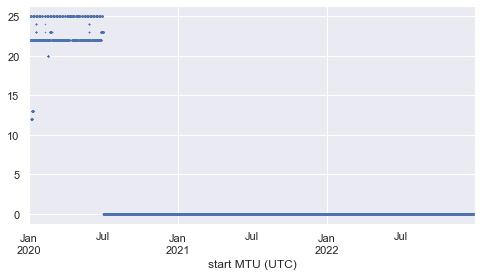

In [322]:
df['Fossil Gas - BZN|NO1'].plot(lw=0, marker=".", markersize=1 , figsize = (8,4));

#### Fossil Gas - BZN|SE3

In [323]:
distinct_values_gas_SE3 =df['Fossil Gas - BZN|SE3'].value_counts()
distinct_values_gas_SE3

0.0     26209
90.0       35
45.0       27
15.0       10
11.0        3
3.0         3
54.0        2
20.0        2
26.0        2
17.0        2
7.0         2
5.0         1
87.0        1
24.0        1
40.0        1
64.0        1
27.0        1
Name: Fossil Gas - BZN|SE3, dtype: int64

In [324]:
# The percentage of 0's in 'Fossil Gas - BZN|SE3' is 0.99
df['Fossil Gas - BZN|SE3'].where(df['Fossil Gas - BZN|SE3'] == 0).count()/ df.shape[0]

0.9963883819951338

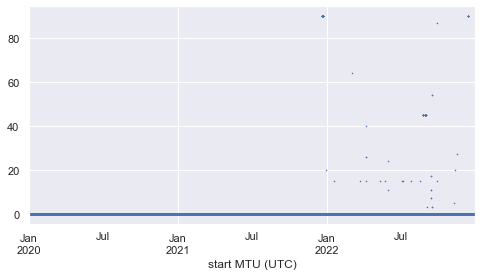

In [325]:
df['Fossil Gas - BZN|SE3'].plot(lw=0, marker="*", markersize=1, figsize = (8,4));

## 2. Quality Investigation

### Missing values
we should handle missing values after splitting to avoid data leakage.

In [326]:
# Missing values in each colum in descending order, ' Other renewable - BZN|NO3' column has the most missing values(73).
missing_val_per_feature= df.isna().sum().sort_values(ascending = False)
missing_val_per_feature

Other renewable - BZN|NO3                                  73
CBF BZN|NO1 > BZN|NO3 [MW]                                 31
CBF BZN|NO1 > BZN|NO2 [MW]                                 31
CBF BZN|NO2 > BZN|NO1 [MW]                                 31
CBF BZN|NO5 > BZN|NO1 [MW]                                 31
CBF BZN|NO1 > BZN|NO5 [MW]                                 31
CBF BZN|NO3 > BZN|NO1 [MW]                                 31
Fossil Gas - BZN|NO2                                        6
Hydro Water Reservoir - BZN|NO3                             5
Waste - BZN|NO2                                             5
Waste - BZN|NO5                                             5
Hydro Water Reservoir - BZN|NO5                             5
Hydro Run-of-river and poundage - BZN|NO5                   5
Hydro Pumped Storage Aggregated- BZN|NO5                    5
Fossil Gas - BZN|NO5                                        5
Wind Onshore - BZN|NO3                                      5
Waste - 

In [327]:
# % of missing values in each feature in descending order
# 'Other renewable - BZN|NO3' has most percentage of missing values.
mis_val_percent = 100 * df.isnull().sum() / len(df)
mis_val_percent.sort_values(ascending= False)

Other renewable - BZN|NO3                                  0.277524
CBF BZN|NO1 > BZN|NO3 [MW]                                 0.117853
CBF BZN|NO1 > BZN|NO2 [MW]                                 0.117853
CBF BZN|NO2 > BZN|NO1 [MW]                                 0.117853
CBF BZN|NO5 > BZN|NO1 [MW]                                 0.117853
CBF BZN|NO1 > BZN|NO5 [MW]                                 0.117853
CBF BZN|NO3 > BZN|NO1 [MW]                                 0.117853
Fossil Gas - BZN|NO2                                       0.022810
Hydro Water Reservoir - BZN|NO3                            0.019009
Waste - BZN|NO2                                            0.019009
Waste - BZN|NO5                                            0.019009
Hydro Water Reservoir - BZN|NO5                            0.019009
Hydro Run-of-river and poundage - BZN|NO5                  0.019009
Hydro Pumped Storage Aggregated- BZN|NO5                   0.019009
Fossil Gas - BZN|NO5                            

In [328]:
# There are 102 rows missing values for at least one feature. 2020-01-13 is a complete day with missing valus for import and export within Norwegian bidding zones.
df[df.isna().any(axis=1)]

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
start MTU (UTC),,,,,,,,,,,,,,,,,,,,,
2020-01-12 23:00:00,24.92,24.92,22.52,24.92,22.52,4688.0,4442.0,3263.0,2011.0,9848,...,NaN,NaN,NaN,1750,0,3844000.0,24560000.0,5541000.0,11074000.0,2189000.0
2020-01-13 00:00:00,24.54,24.54,23.91,24.54,23.91,4427.0,4354.0,3172.0,1986.0,9747,...,NaN,NaN,NaN,1442,0,3718000.0,24476000.0,5285000.0,10810000.0,2168000.0
2020-01-13 01:00:00,24.66,24.66,23.96,24.66,23.96,4387.0,4365.0,3192.0,1972.0,9741,...,NaN,NaN,NaN,1449,0,3718000.0,24476000.0,5285000.0,10810000.0,2168000.0
2020-01-13 02:00:00,24.85,24.85,24.26,24.85,24.26,4402.0,4402.0,3114.0,1964.0,9830,...,NaN,NaN,NaN,1351,0,3718000.0,24476000.0,5285000.0,10810000.0,2168000.0
2020-01-13 03:00:00,25.33,25.33,25.01,25.33,25.01,4506.0,4417.0,3193.0,2027.0,10047,...,NaN,NaN,NaN,1372,0,3718000.0,24476000.0,5285000.0,10810000.0,2168000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-03 12:00:00,58.92,51.79,50.31,58.92,58.92,7132.0,5878.0,4296.0,2691.0,15182,...,0.0,2788.0,0.0,0,1433,3195000.0,24358000.0,4917000.0,9289000.0,1612000.0
2021-02-15 13:00:00,50.28,50.28,46.09,50.28,50.28,7554.0,6246.0,4183.0,2651.0,14399,...,0.0,2857.0,0.0,0,824,2581663.0,21997976.0,4169409.0,7744098.0,1341000.0
2021-06-16 11:00:00,50.09,50.09,33.41,50.09,70.45,3292.0,3792.0,2809.0,1789.0,9204,...,4.0,1832.0,0.0,0,1372,4270695.0,22198664.0,6275868.0,8674483.0,2026000.0


### Duplicate Values
Since proving that the two concentrations are under the exact same conditions , is impossible for us. We trust the datasource for this dataset which is European Network of Transmission System Operators for Electricity(https://transparency.entsoe.eu/).

### Unwanted and invalid values :

Invalid values can be even more dangerous than missing values, they are often more challenging to detect. Based on our analysis there are no unwanted values , only NaN values which will be handled after EDA in cleaning process.

### Outliers :
Outliers represent measurement errors, data entry or processing errors, or poor sampling
Not all outliers are problematic some outliers represent natural variations in the population, and they should be left as is in the dataset. These are called true outliers. We do not have any reason to remove outliers , we trust our dataprovider(entso-e). Normalizing outliers is not an option for this project since we risk significantly skewing the regression results. Effects of Outliers are ;

1. Skewing of mean and standard deviation
2. Could significantly affect significance readings when generating regression analysis
3. Can give us false readings on the magnitude of correlations

But we are going to study outliers after feature correlation section. we shall divide the dataset in 5 categories and study each of them closer for finding more about outliers

https://statisticsbyjim.com/basics/remove-outliers/#:~:text=Removing%20outliers%20is%20legitimate%20only,the%20process%20or%20study%20area.

https://towardsdatascience.com/5-ways-to-detect-outliers-that-every-data-scientist-should-know-python-code-70a54335a623


## 3. Content Investigation


### Plotting all features
To study trend, seasonality and distribution for each feature.

##### .plot()
- lw=0: lw stands for line width. 0 means that we don’t want to show any lines
- marker=".": Instead of lines, we tell the plot to use . as markers for each data point
- layout=(-1, 4): This parameter tells pandas how many rows and columns to use for the subplots. The -1 means “as many as needed”, while the 2 means to use 2 columns per row.
- figsize=(20, 55), markersize=1: To make sure that the figure is big enough, figure height is roughly the number of features
##### Day-ahead prices:
- We can clearly see that the seasonality of day-ahead prices for different bidding zones matches. There are huge volatilises in prices after 2021. One of the biggest spikes in prices happened in February 2022 after  Russia invaded Ukraine. looking at day-ahead price subplots, there are huge spikes in prices especially around January 2022 as a result of the Ukraine war and the disrupted energy supply chain in Europe.

##### Total Load :
- The seasonality of total load for different bidding zones matches. The minimum load is around summer(July) and the maximum load is around January for each year.

##### Imports and exports NO1:
- imports from NO3 is quite more than the exports to NO3.
-  Imports from NO2 are almost 2 times the exports to NO2.  Around June 2022 we see a big drop in imports from NO2 which lasted until August 2022. At the same time period, there is a 100% increase in the exports to NO2.
- Imports fra NO5 are almost 3 times higher than exports to NO5.
- Most exports from NO1 is to NO3 og SE3.

#### Generation per unit type:
- NO1 :
	- Zero fossil Gas after the second quarter of 2020
	- 200 % increase for Hydro Run-of-river and poundage after October 2021
	- 50 % increase for wind onshore in 2022 compared to 2021
	- Other containing only 0, have to drop it after EDA
	- Waste has a sideways trend after a temporary drop around Mars 2021.
	- Water Reservoirs & Hydro Storage Plants in NO1 is the second-biggest Water Reservoirs & Hydro Storage Plants in 5 zones right after NO3. Matches the seasonality for Norwegian bidding zones, but not the Swedish bidding zone.
- NO2:
     - Small values for fossil gas under 5 MW
	- 200 % increase for Hydro Run-of-river and poundage after October 2021. And 3 times higher values than NO1 with side vise trend
	- Other values is 0 MW after July 2020
    - Hydro pumped storage aggregated has a downward trend as it decreases by 50 % after October 2021.

- NO3:
    - Zero fossil Gas after the second quarter of 2020
	- Biggest generation type for NO3 is Water Reservoirs & Hydro Storage Plants. This is the biggest generation source in all 5 zones in this dataset.
	- 350-400 % increase for Hydro Run-of-river and poundage after October 2021
	- 80% increase for wind onshore after October 2022
	- Power generation from waste in NO3 is the least power generation compared to other bidding zones, with values under 7 MW in 2020-2022.
    - Other is 0 after November 2021. and from the same period 'Other Renewable ' have some values.

- NO5 :
	- Fossil gas has a big downward trend after May 2022 by 70 %.
	- 300 % increase for Hydro Run-of-river and poundage after October 2021. Still the least among this type of power generation in NO1, NO2, and NO3.
	- Waste has a side wise trend
	- 'Other' decreased to 0 after May 2020.
	- There are no values for 'Hydro pumped storage aggregated ' before July 2022
    - Water Reservoirs & Hydro Storage Plants in NO5 is the least power generation compared to other bidding zones.

  SE3 :
	- Fossil gas increased after January 2022, from 0 to 20, and a peak at 80 MW. Result from war.
	- Does not have 'Hydro run.off.river and poundage'.
	- Very stable and side wise tends for wind onshore with higher values than Norwegian zones since 2020.
	- Generated over 5000 MW using Nuclear Technology, right after December 2021.
	- At the same time 'Other' picks up from 0 to 15000 MW
	- Downward Trend for 'Water Reservoirs & Hydro Storage Plants' since 2020, with 50% decrease from 2021 to 2022.


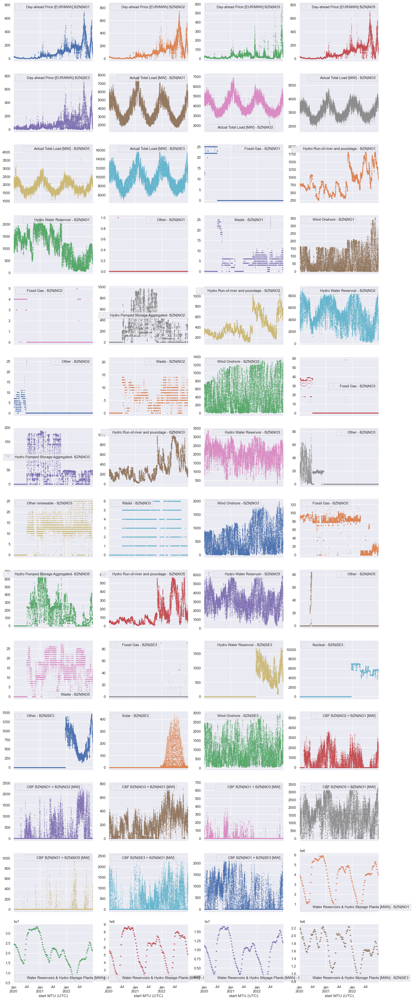

In [329]:
df.plot(lw=0, marker=".", subplots=True, layout=(-1, 4),
          figsize=(20, 55), markersize=1);


### Remove features with very low variance
Reducing number of features is usually done after EDA is finished, but clearly there are some features that does not help our model and are useless. Reason for that is very low variance, this means many rows with 0 values or just not big enough values (MW) that we can consider them as factors for fluctuating prices in the year 2022. QQuality of data is very important and data should be consistent. The main electricity generation in Norway is not fossil energy therefore , 'Fossil Gas' can be dropped for all mentioned reasons.


Those features are
- Fossil gas for zones NO1,NO2, NO3, NO5, SE3
- Other for zones NO1, NO2, NO3, No5 (does not include 'Other renewable')

In [330]:
df.drop(['Fossil Gas - BZN|NO1', 'Fossil Gas - BZN|SE3',
         'Fossil Gas - BZN|NO2', 'Fossil Gas - BZN|NO3',
         'Fossil Gas - BZN|NO5', 'Other - BZN|NO1',
         'Other - BZN|NO2', 'Other - BZN|NO3', 'Other - BZN|NO5'], inplace =True,  axis = 1)

### Dropping data for 2020 and 2021

Based on the plots above we can see alot of missing values and zero values for generation category around 2020 and 2021. Looking at SE3 , two of the biggest generation units which are 'Nuclear' and 'Hydro Water Reservoir' , do not have any value/data for 2020 and 2021. We can not drop SE3 bidding zone therefore must limit our models to 2022 only. This is also sensible because ukraine war started in 2022 and changed electricity marked dynamics, we see very big spikes in price more often in 2022 compared to the years before.


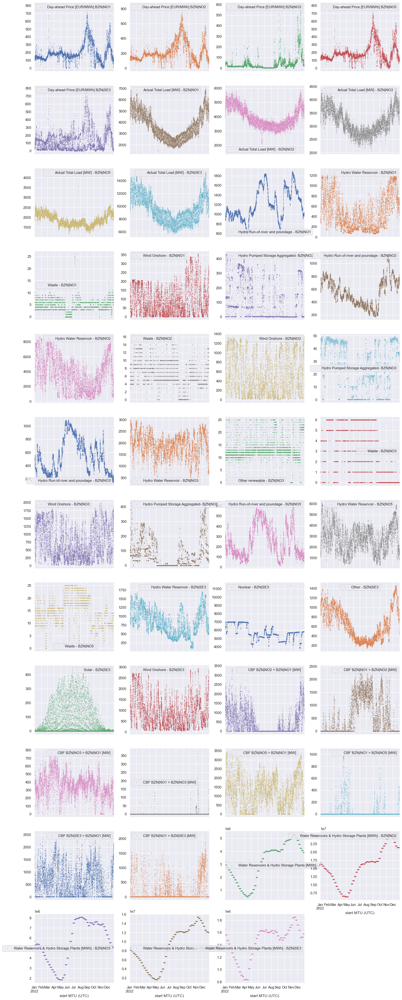

In [331]:
df_2022= df.loc[ '2022-01-01' : '2022-12-31']
df_2022.plot(lw=0, marker=".", subplots=True, layout=(-1, 4),
        figsize=(20, 55), markersize=1);

### Feature distribution
We will study feature distribution for each category more in the next section. But at this stage we know that there is no need for normal distribution in our regression analysis. We require Best Linear Unbiased Estimator (BLUE).

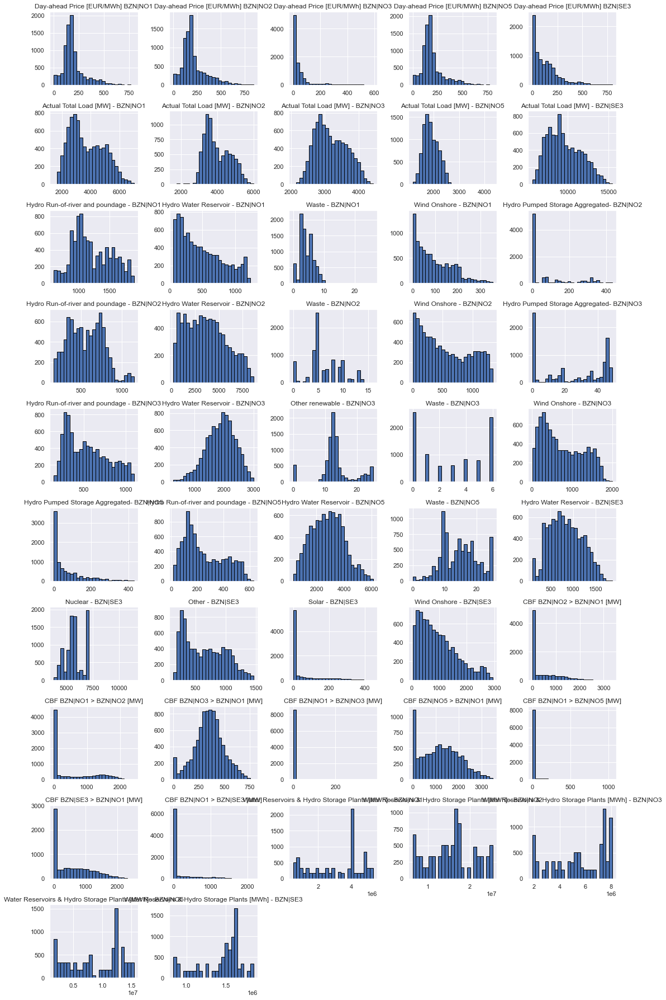

In [332]:
# Plots the histogram for each numerical feature in a separate subplot
df_2022.hist(bins=25, figsize=(15, 25), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

### Pair-plot()

In [333]:
# identify numerical features with more or less than 25 unique features. This will be used for .pairPlot()
cols_continuous = df_2022.select_dtypes(include="number").nunique() >= 25
cols_continuous

Day-ahead Price [EUR/MWh] BZN|NO1                           True
Day-ahead Price [EUR/MWh] BZN|NO2                           True
Day-ahead Price [EUR/MWh] BZN|NO3                           True
Day-ahead Price [EUR/MWh] BZN|NO5                           True
Day-ahead Price [EUR/MWh] BZN|SE3                           True
Actual Total Load [MW] - BZN|NO1                            True
Actual Total Load [MW] - BZN|NO2                            True
Actual Total Load [MW] - BZN|NO3                            True
Actual Total Load [MW] - BZN|NO5                            True
Actual Total Load [MW] - BZN|SE3                            True
Hydro Run-of-river and poundage - BZN|NO1                   True
Hydro Water Reservoir - BZN|NO1                             True
Waste - BZN|NO1                                            False
Wind Onshore - BZN|NO1                                      True
Hydro Pumped Storage Aggregated- BZN|NO2                    True
Hydro Run-of-river and po

In [334]:
# Create a new dataframe which only contains the continuous features
df_continuous = df_2022[cols_continuous[cols_continuous].index]
df_continuous.shape

(8760, 44)

In [335]:
# Pair-plot for first 5 columns
first = df_continuous.iloc[:, 0:5]

sns.set(font_scale = 1)
#fig = sns.pairplot( first, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

In [336]:
second = df_continuous.iloc[:, 5:10]

sns.set(font_scale = 1)
#fig = sns.pairplot( second, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

In [337]:
third = df_continuous.iloc[:, 10:15]

sns.set(font_scale = 1)
#fig = sns.pairplot( third, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

In [338]:
fourth = df_continuous.iloc[:, 15:20]

sns.set(font_scale = 1)
#fig = sns.pairplot( fourth, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

In [339]:
fifth = df_continuous.iloc[:, 20:25]

sns.set(font_scale = 1)
#fig = sns.pairplot( fifth, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

In [340]:
fifth = df_continuous.iloc[:, 25:30]

sns.set(font_scale = 1)
#fig = sns.pairplot( fifth, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

In [341]:
fifth = df_continuous.iloc[:, 30:35]

sns.set(font_scale = 1)
#fig = sns.pairplot( fifth, height=1.5, plot_kws={"s": 2, "alpha": 0.2} );
fig.fig.set_size_inches(18,18)

### Feature Correlation

C:\Users\Isak\AppData\Local\Temp\ipykernel_23648\2851445434.py:5: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  cb = plt.colorbar()


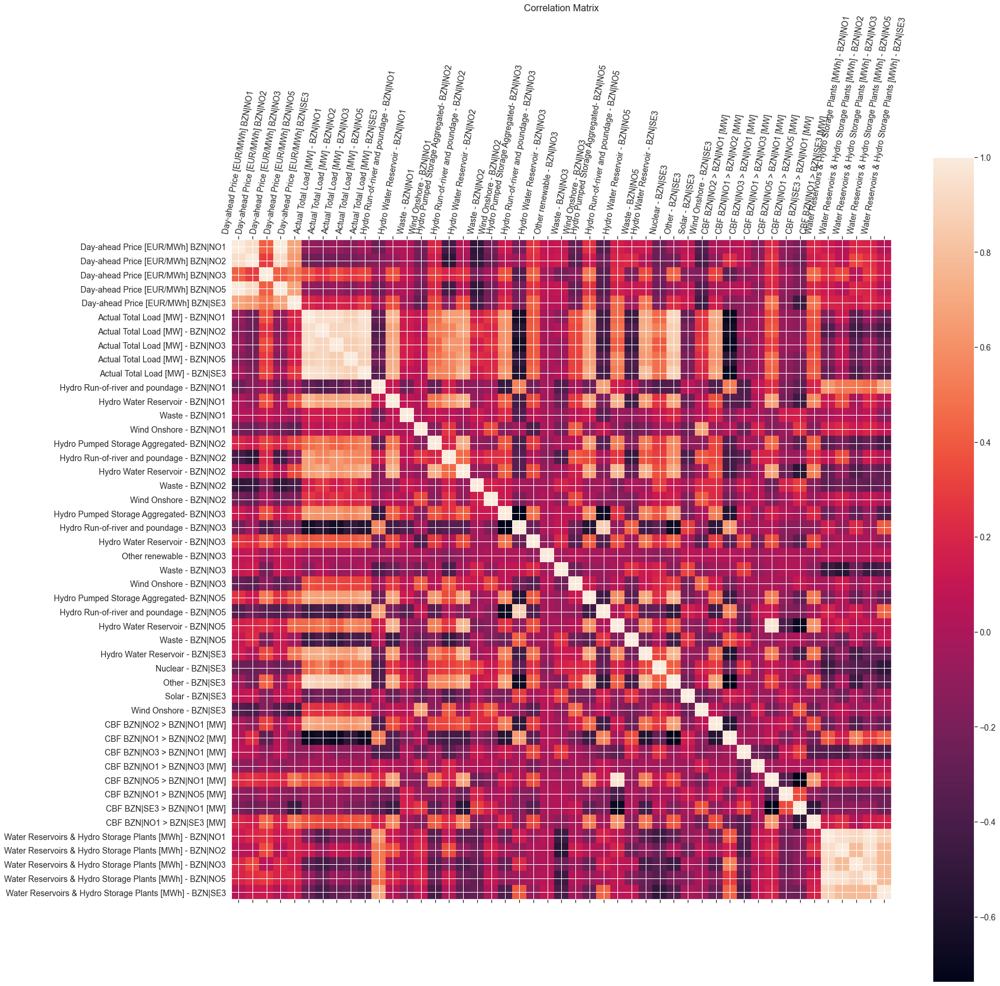

In [342]:
f = plt.figure(figsize=(25, 25))
plt.matshow(df_2022.corr(), fignum=f.number)
plt.xticks(range(df_2022.select_dtypes(['number']).shape[1]), df_2022.select_dtypes(['number']).columns, fontsize=14, rotation=80)
plt.yticks(range(df_2022.select_dtypes(['number']).shape[1]), df_2022.select_dtypes(['number']).columns, fontsize=14)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

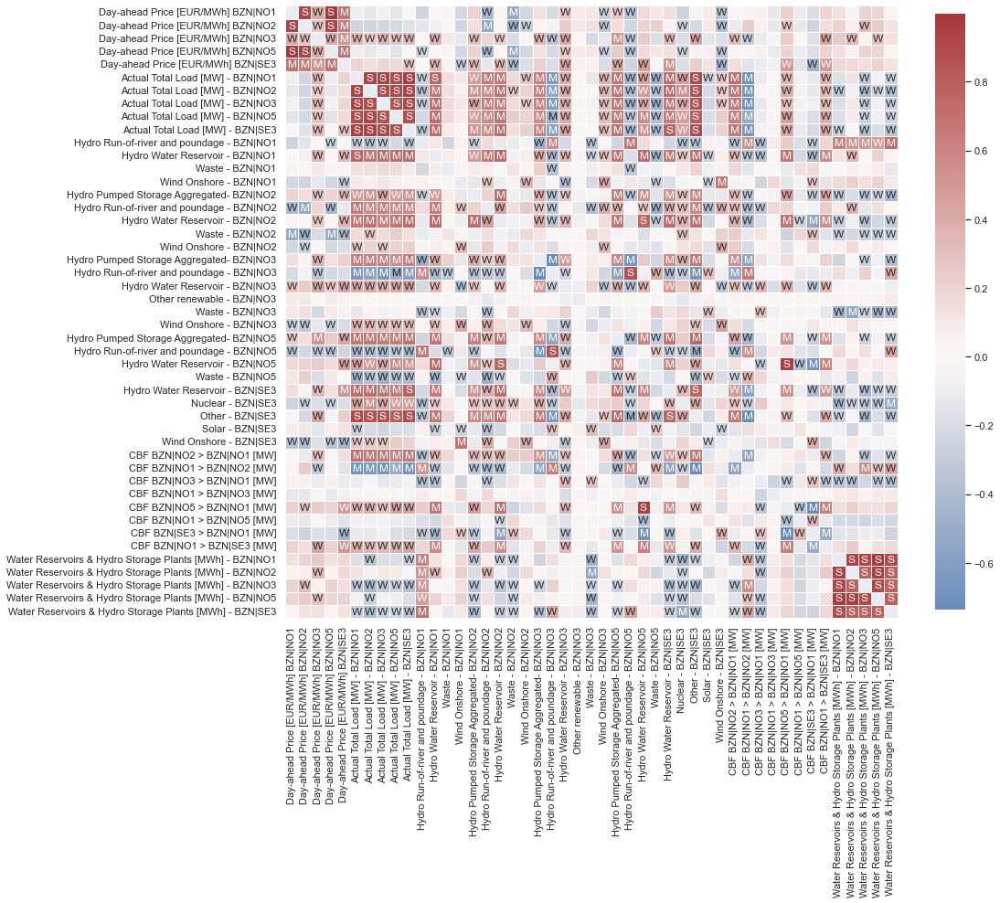

In [343]:
# Computes feature correlation
df_corr = df_2022.corr(method="pearson")

# Create labels for the correlation matrix
labels = np.where(np.abs(df_corr)>0.75, "S",
                  np.where(np.abs(df_corr)>0.5, "M",
                           np.where(np.abs(df_corr)>0.25, "W", "")))

# Plot correlation matrix
plt.figure(figsize=(15, 15))
sns.heatmap(df_corr, mask=np.eye(len(df_corr)), square=True,
            center=0, annot=labels, fmt='', linewidths=.5,
            cmap="vlag", cbar_kws={"shrink": 0.8});

### Creating five dataframes from 56 features to study and analyse our data as categories.

### Price Category

In [344]:
# Price category with 0 missing values
price_column_names = ['Day-ahead Price [EUR/MWh] BZN|NO1', 'Day-ahead Price [EUR/MWh] BZN|NO2', 'Day-ahead Price [EUR/MWh] BZN|NO3', 'Day-ahead Price [EUR/MWh] BZN|NO5', 'Day-ahead Price [EUR/MWh] BZN|SE3']
price_columns = df_2022[price_column_names]

df_2022.loc[:, price_column_names].isna().sum()

Day-ahead Price [EUR/MWh] BZN|NO1    0
Day-ahead Price [EUR/MWh] BZN|NO2    0
Day-ahead Price [EUR/MWh] BZN|NO3    0
Day-ahead Price [EUR/MWh] BZN|NO5    0
Day-ahead Price [EUR/MWh] BZN|SE3    0
dtype: int64

In [345]:
price_columns.describe()

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,192.510402,211.277426,41.938296,192.060664,129.200469
std,109.738988,125.849578,67.427388,109.260234,127.901438
min,0.040000,0.040000,-2.080000,0.040000,-2.080000
25%,131.042500,132.635000,11.600000,131.180000,27.090000
50%,168.925000,181.130000,16.905000,168.540000,94.120000
75%,214.822500,253.917500,45.415000,213.525000,187.372500
max,799.970000,844.000000,590.000000,799.970000,799.970000


In [346]:
# Finding hour with minimum price for NO1
price_NO1 = df_2022['Day-ahead Price [EUR/MWh] BZN|NO1']
min_row = df_2022[price_NO1 == price_NO1.min()]
min_row

,Day-ahead Price [EUR/MWh] BZN|NO1,Day-ahead Price [EUR/MWh] BZN|NO2,Day-ahead Price [EUR/MWh] BZN|NO3,Day-ahead Price [EUR/MWh] BZN|NO5,Day-ahead Price [EUR/MWh] BZN|SE3,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3,...,CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW],Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
start MTU (UTC),,,,,,,,,,,,,,,,,,,,,
2022-11-11 03:00:00,0.04,0.04,-0.07,0.04,-0.07,2950.0,3378.0,2899.0,1576.0,7583,...,113.0,295.0,0.0,1094,0,5323211.0,25449076.0,7411170.0,15431832.0,1842000.0


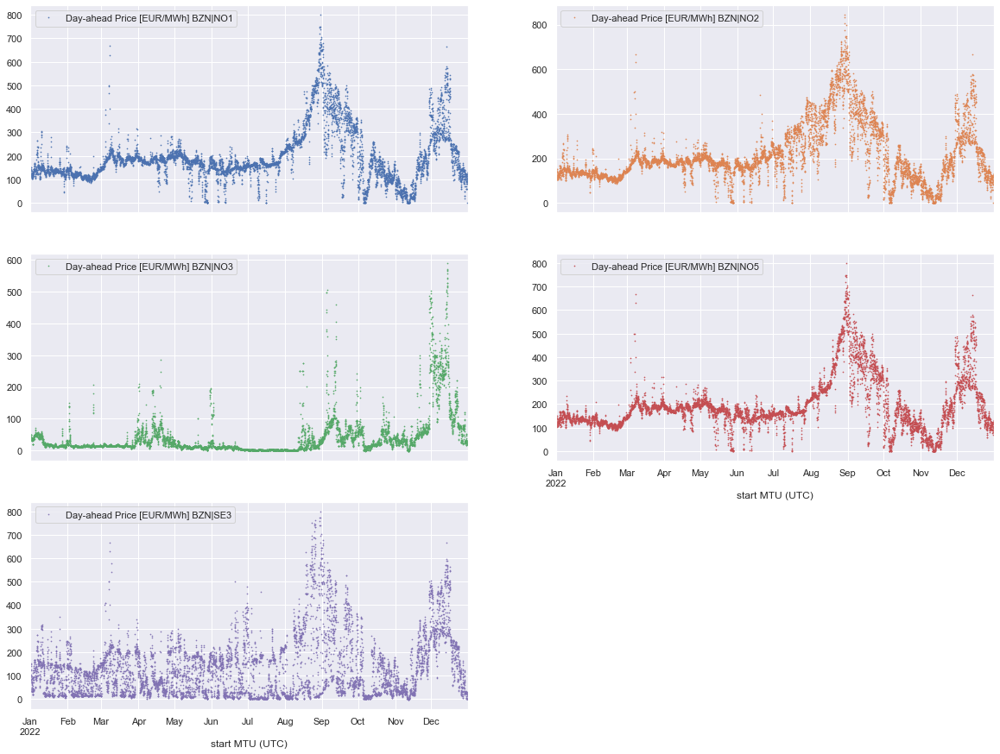

In [400]:
price_columns.plot(lw=0, marker=".", subplots=True, layout=(-1, 2),
                   figsize=(20, 15), markersize=1.3);

#### Outliers Price Category
Outliers in our dataset occur due to volatility in marked and do not present experimental or human error.
Changing outliers values is necessary before analysing feature distribution and feature correlation.

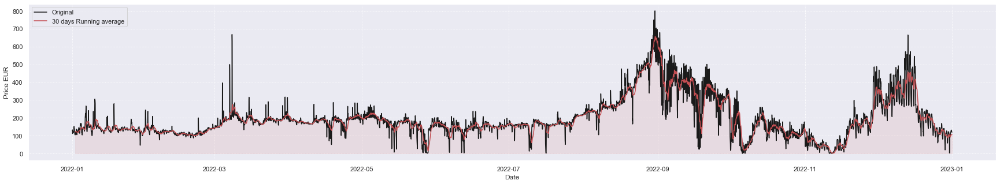

In [407]:
first_half =  df.loc[ '2022-01-01' : '2022-06-30']
second_half =  df.loc[ '2022-07-01' : '2022-12-31']


price_no1 = df_2022['Day-ahead Price [EUR/MWh] BZN|NO1']
price_no1_average = price_no1.rolling(window=30).mean()

plt.figure(figsize=(30, 5))


plt.plot(price_no1, 'k-', label='Original')
plt.plot(price_no1_average, 'r-', label='10 days Running average')
plt.ylabel('Price EUR')
plt.xlabel('Date')
plt.grid(linestyle=':')
plt.fill_between(price_no1_average.index, 0, price_no1_average, color='r', alpha=0.1)
plt.legend(loc='upper left')
plt.show()

Text(0.5, 0, 'Sample')

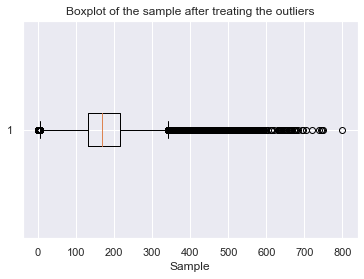

In [404]:
## boxplots can not show outliers for our dat, beacuase we are interesert in finding outliers for 10 or 30 days prices, but boxplot does it for the whole year . Therefore it seems like 800 EUR/KW is an outlier looking at boxplot below.
plt.boxplot(price_no1,  vert=False)
plt.title("Boxplot of the sample after treating the outliers")
plt.xlabel("Sample")

Outliers from Z-scores method:  [667.92, 629.85, 527.1, 534.41, 532.02, 532.0, 522.41, 527.77, 523.46, 521.9, 566.57, 567.18, 566.62, 570.42, 567.49, 561.07, 573.75, 528.36, 582.36, 599.9, 611.2, 638.75, 639.51, 634.38, 599.91, 566.32, 569.94, 560.07, 603.65, 633.38, 637.02, 633.29, 633.35, 639.06, 640.04, 638.45, 631.68, 662.35, 614.1, 585.01, 584.96, 594.99, 658.89, 677.05, 744.65, 749.37, 719.71, 672.0, 648.06, 587.56, 590.25, 571.71, 613.13, 660.25, 694.95, 747.65, 799.97, 739.5, 682.58, 650.6, 592.16, 547.35, 538.94, 555.31, 556.2, 573.39, 645.0, 672.75, 703.74, 666.08, 649.97, 648.05, 571.81, 546.01, 536.26, 576.16, 651.39, 668.57, 696.1, 674.09, 652.57, 577.47, 543.26, 572.82, 595.0, 648.47, 644.83, 599.85, 581.46, 538.72, 527.6, 556.91, 580.05, 619.92, 654.81, 678.91, 663.15, 632.41, 565.02, 530.91, 565.09, 581.97, 546.76, 549.96, 570.1, 542.5, 530.0, 549.9, 582.97, 525.05, 544.33, 529.93, 553.71, 545.22, 526.33, 550.01, 529.93, 532.13, 542.35, 571.04, 541.34, 555.18, 537.25, 5

C:\Users\Isak\AppData\Local\Temp\ipykernel_23648\3247036111.py:18: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  y = np.fromstring( str(sample_outliers)[1:-1], dtype=np.float, sep=',' )


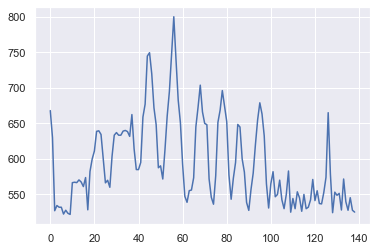

In [402]:
outliers = []
sample = df_2022['Day-ahead Price [EUR/MWh] BZN|NO1']
def detect_outliers_zscore(data):
    thres = 3
    mean = np.mean(data)
    std = np.std(data)
    # print(mean, std)
    for i in data:
        z_score = (i-mean)/std
        if (np.abs(z_score) > thres):
            outliers.append(i)
    return outliers# Driver code
sample_outliers = detect_outliers_zscore(sample)
print("Outliers from Z-scores method: ", sample_outliers)

from numpy import array

y = np.fromstring( str(sample_outliers)[1:-1], dtype=np.float, sep=',' )
plt.plot(y)
plt.show()

In [350]:
median = np.median(sample)# Replace with median
for i in sample_outliers:
    c = np.where(sample==i, 14, sample)
print("Sample: ", sample)
print("New array: ",c)
#print(x.dtype)

Sample:  start MTU (UTC)
2022-01-01 00:00:00    129.30
2022-01-01 01:00:00    132.08
2022-01-01 02:00:00    111.44
2022-01-01 03:00:00    112.35
2022-01-01 04:00:00    113.90
                        ...  
2022-12-31 19:00:00    123.61
2022-12-31 20:00:00    121.09
2022-12-31 21:00:00    120.00
2022-12-31 22:00:00    119.98
2022-12-31 23:00:00    119.32
Name: Day-ahead Price [EUR/MWh] BZN|NO1, Length: 8760, dtype: float64
New array:  [129.3  132.08 111.44 ... 120.   119.98 119.32]


Text(0.5, 0, 'Sample')

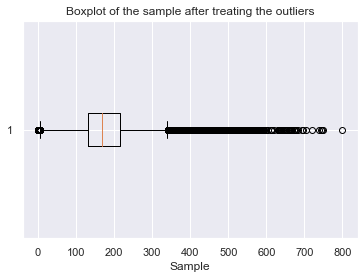

In [351]:
plt.boxplot(c, vert=False)
plt.title("Boxplot of the sample after treating the outliers")
plt.xlabel("Sample")

#### Feature distribution Price Category

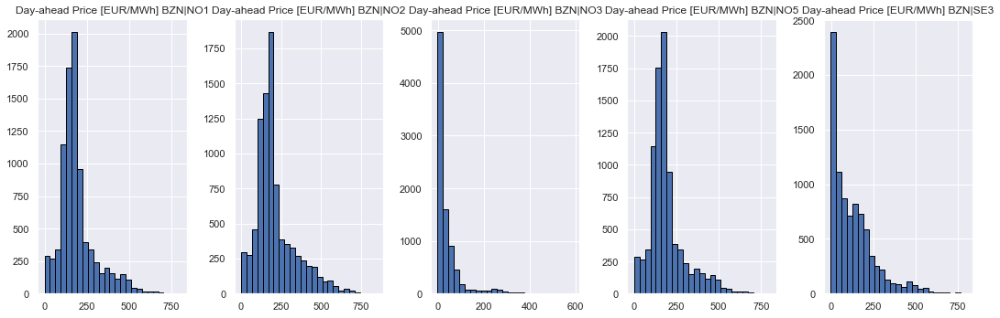

In [352]:
price_columns.hist(bins=25, figsize=(15, 5), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

In [353]:
####  Feature Correlation Price Category

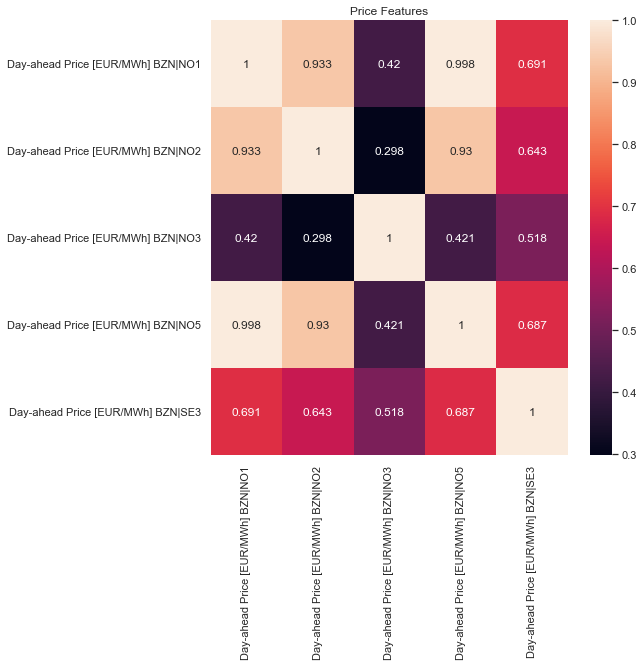

In [354]:
plt.figure(figsize=(8, 8))
df_corr = price_columns.corr()
sns.heatmap(df_corr, annot=True, fmt='.3g')
plt.title("Price Features")
plt.show()

### Load Category

In [355]:
# Load category with 4 missing values
load_column_names = ['Actual Total Load [MW] - BZN|NO1','Actual Total Load [MW] - BZN|NO2',
                     'Actual Total Load [MW] - BZN|NO3','Actual Total Load [MW] - BZN|NO5', 'Actual Total Load [MW] - BZN|SE3']
load_columns = df_2022[load_column_names]

# Counts total NaN in load_columns = 4
load_columns.isnull().sum().sum()
load_columns.isna().sum()


Actual Total Load [MW] - BZN|NO1    0
Actual Total Load [MW] - BZN|NO2    0
Actual Total Load [MW] - BZN|NO3    0
Actual Total Load [MW] - BZN|NO5    0
Actual Total Load [MW] - BZN|SE3    0
dtype: int64

In [356]:
load_columns.describe()

,Actual Total Load [MW] - BZN|NO1,Actual Total Load [MW] - BZN|NO2,Actual Total Load [MW] - BZN|NO3,Actual Total Load [MW] - BZN|NO5,Actual Total Load [MW] - BZN|SE3
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,3711.929110,3985.057306,3179.632648,1878.106050,9575.168721
std,1174.433741,691.811619,459.275125,289.228203,2037.710339
min,1446.000000,1595.000000,2062.000000,1164.000000,5672.000000
25%,2741.000000,3436.000000,2812.000000,1660.000000,7912.750000
50%,3466.000000,3813.000000,3114.000000,1837.000000,9223.500000
75%,4671.000000,4542.000000,3541.250000,2087.000000,11114.750000
max,7011.000000,5988.000000,4432.000000,4326.000000,15486.000000


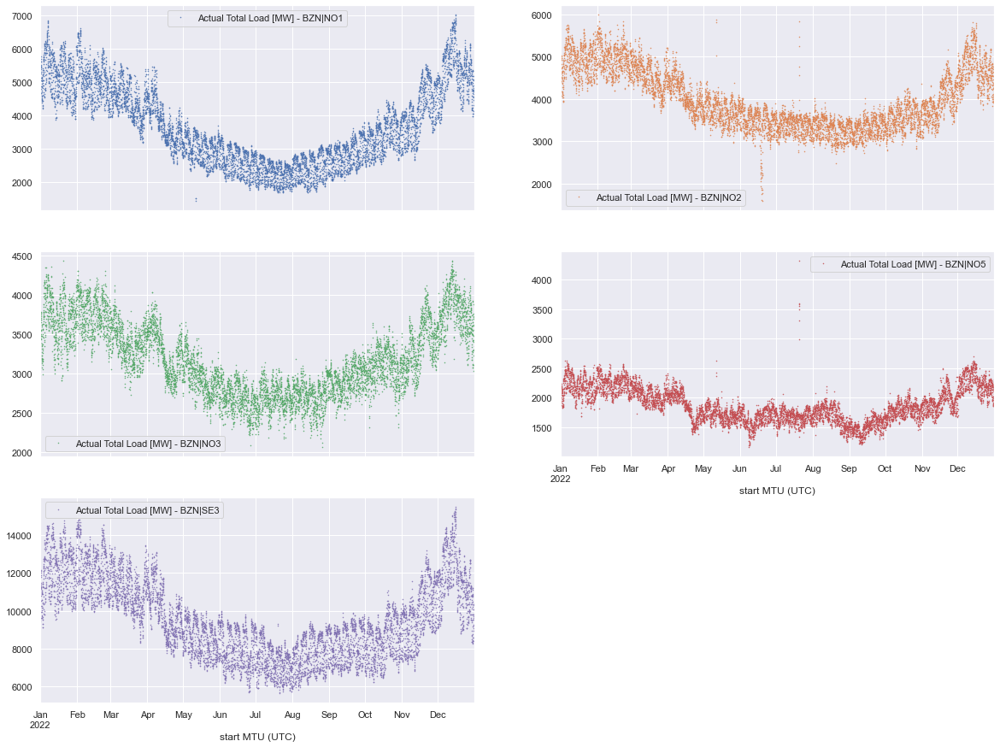

In [357]:
load_columns.plot(lw=0, marker=".", subplots=True, layout=(-1, 2),
                  figsize=(20, 15), markersize=1);

#### Feature distribution Laod Category

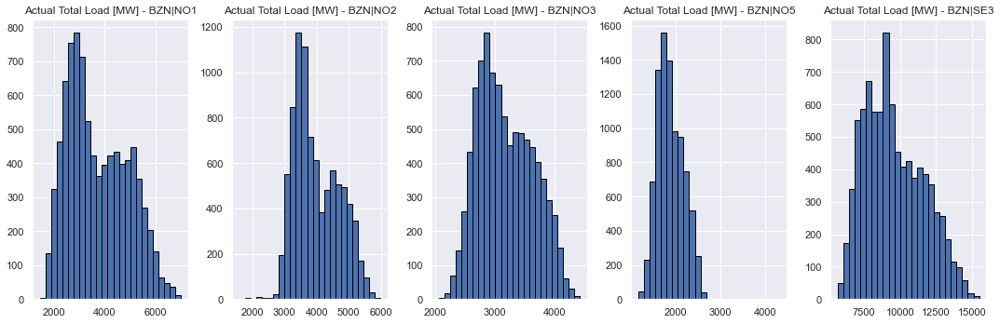

In [358]:
load_columns.hist(bins=25, figsize=(15, 5), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

####  Feature Correlation Load Category

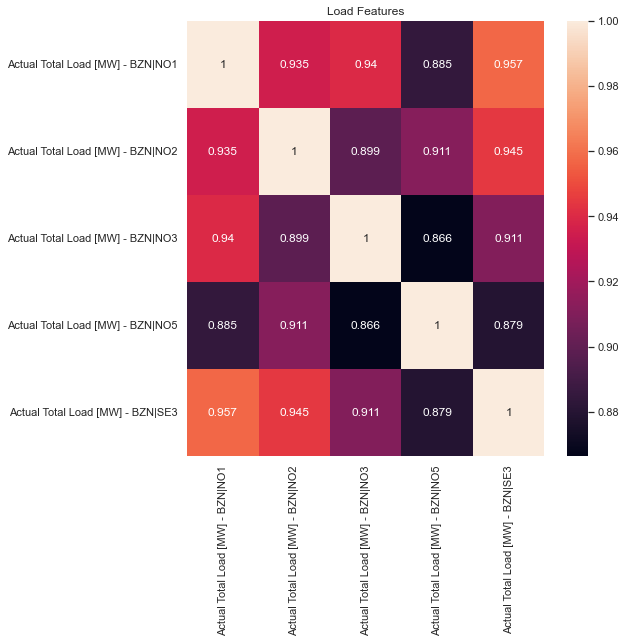

In [359]:
plt.figure(figsize=(8, 8))
df_corr = load_columns.corr()
sns.heatmap(df_corr, annot=True, fmt='.3g')
plt.title("Load Features")
plt.show()

### Import & Export Category

In [360]:
# Import and export (CBF) category with 186 missing values
CBF_column_names = ['CBF BZN|NO2 > BZN|NO1 [MW]','CBF BZN|NO1 > BZN|NO2 [MW]',
                    'CBF BZN|NO3 > BZN|NO1 [MW]','CBF BZN|NO1 > BZN|NO3 [MW]',
                    'CBF BZN|NO5 > BZN|NO1 [MW]','CBF BZN|NO1 > BZN|NO5 [MW]',
                    'CBF BZN|SE3 > BZN|NO1 [MW]' , 'CBF BZN|NO1 > BZN|SE3 [MW]']
CBF_columns = df_2022[CBF_column_names]

# Counts total NaN in CBF_columns = 186
CBF_columns.isnull().sum().sum()

CBF_columns.isna().sum()

CBF BZN|NO2 > BZN|NO1 [MW]    0
CBF BZN|NO1 > BZN|NO2 [MW]    0
CBF BZN|NO3 > BZN|NO1 [MW]    0
CBF BZN|NO1 > BZN|NO3 [MW]    0
CBF BZN|NO5 > BZN|NO1 [MW]    0
CBF BZN|NO1 > BZN|NO5 [MW]    0
CBF BZN|SE3 > BZN|NO1 [MW]    0
CBF BZN|NO1 > BZN|SE3 [MW]    0
dtype: int64

In [361]:
CBF_columns.describe()

,CBF BZN|NO2 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO2 [MW],CBF BZN|NO3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO3 [MW],CBF BZN|NO5 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|NO5 [MW],CBF BZN|SE3 > BZN|NO1 [MW],CBF BZN|NO1 > BZN|SE3 [MW]
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000
mean,437.366667,539.234475,348.048174,1.393493,1235.515753,26.089840,599.958562,178.111530
std,627.777701,676.148918,143.545291,13.756675,823.543581,109.161657,581.845746,361.792681
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,263.000000,0.000000,562.750000,0.000000,0.000000,0.000000
50%,0.000000,63.500000,349.000000,0.000000,1222.000000,0.000000,483.000000,0.000000
75%,785.250000,1156.000000,435.000000,0.000000,1835.250000,0.000000,1034.000000,128.000000
max,3363.000000,2423.000000,786.000000,377.000000,3476.000000,1052.000000,2520.000000,2155.000000


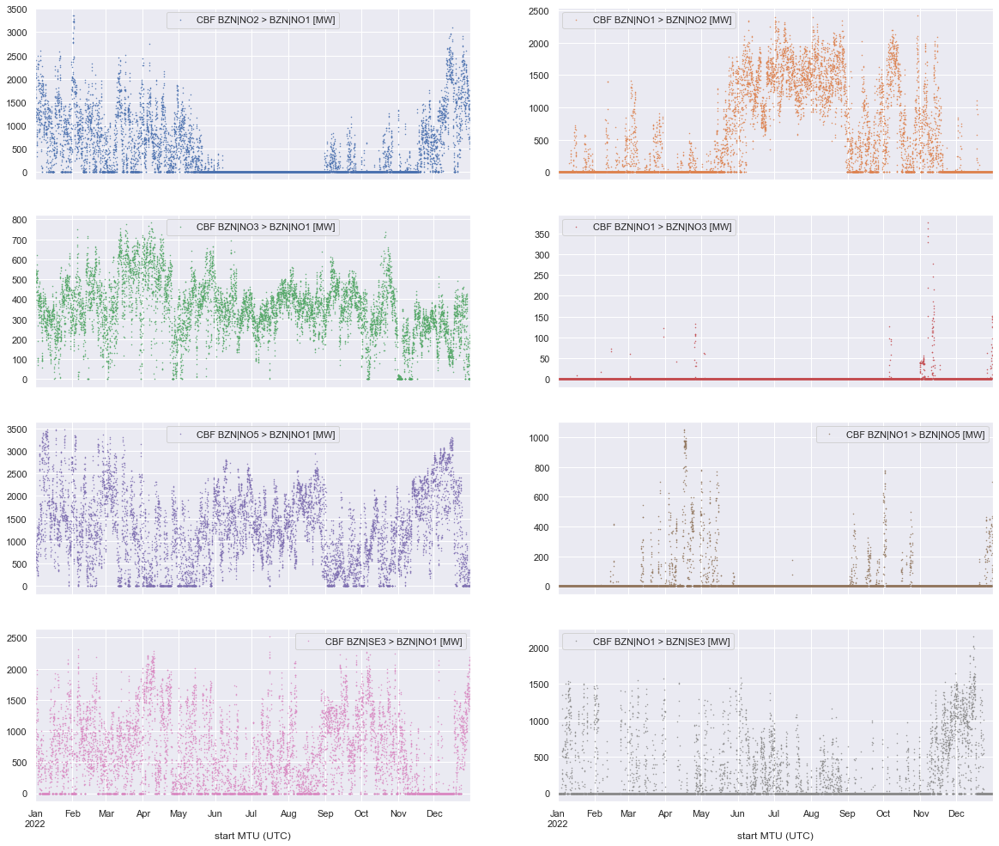

In [362]:
CBF_columns.plot(lw=0, marker=".", subplots=True, layout=(-1, 2),
                 figsize=(20, 17), markersize=1);

#### Feature distribution Import & Export Category

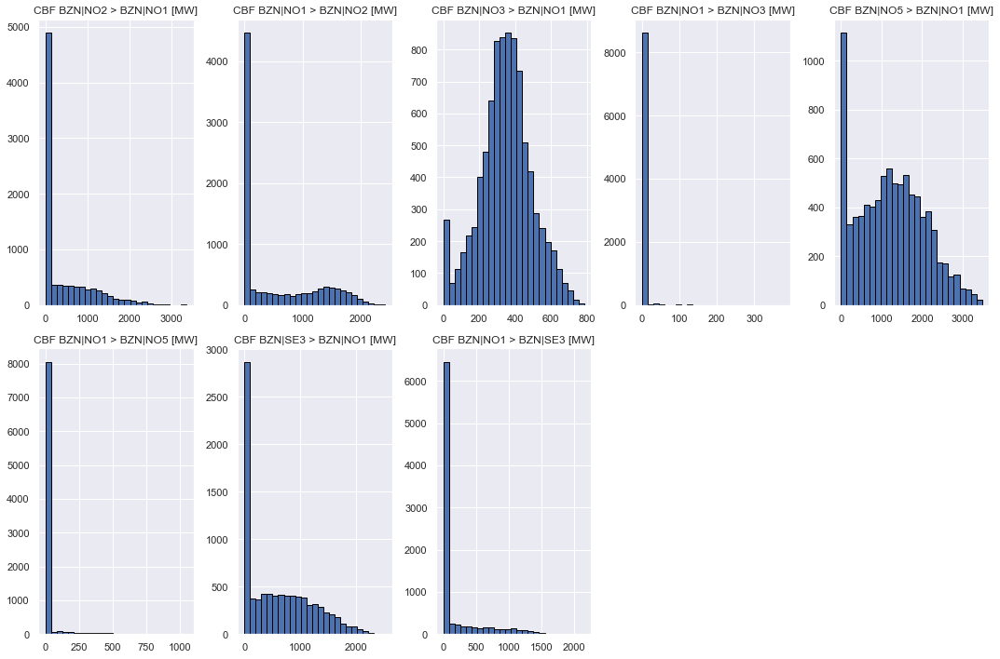

In [363]:
CBF_columns.hist(bins=25, figsize=(15, 10), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

#### Feature Correlation Import & Export Category

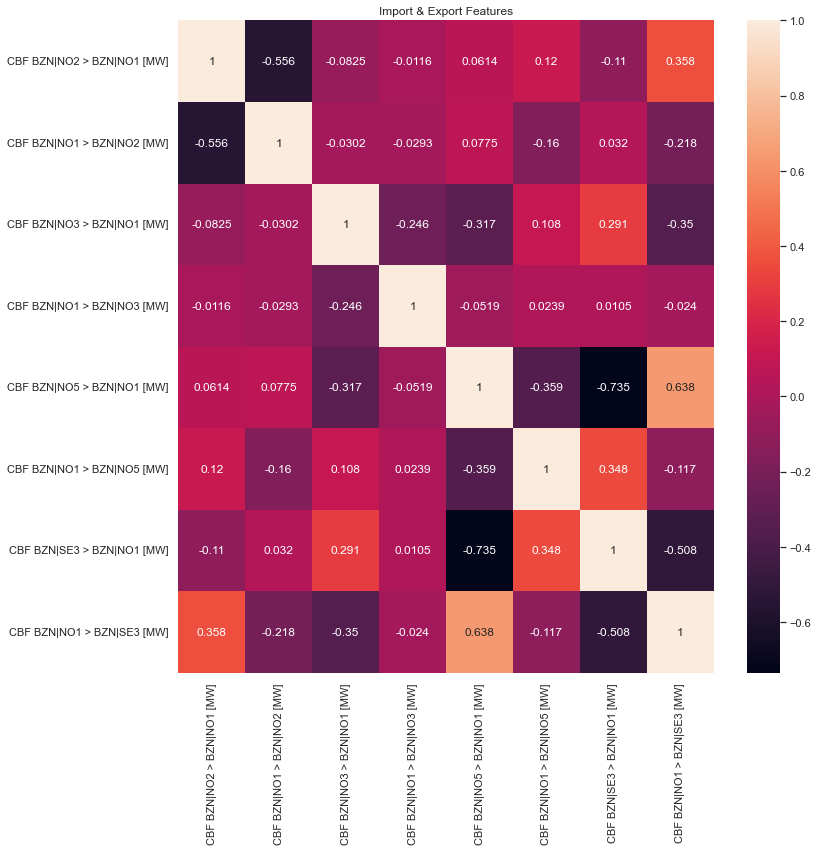

In [364]:
plt.figure(figsize=(12, 12))
df_corr = CBF_columns.corr()
sns.heatmap(df_corr, annot=True, fmt='.3g')
plt.title("Import & Export Features")
plt.show()

### Water Reservoir Category

In [365]:
# Water Reservoir category with 21 missing values
water_reservoir_column_names = ['Hydro Water Reservoir - BZN|NO1','Hydro Water Reservoir - BZN|NO2',
                     'Hydro Water Reservoir - BZN|NO3','Hydro Water Reservoir - BZN|NO5',
                     'Hydro Water Reservoir - BZN|SE3']
water_reservoir_columns = df_2022[water_reservoir_column_names]

# Counts total NaN in water_reservoir_columns = 21
water_reservoir_columns.isnull().sum().sum()
water_reservoir_columns.isna().sum()

Hydro Water Reservoir - BZN|NO1    0
Hydro Water Reservoir - BZN|NO2    0
Hydro Water Reservoir - BZN|NO3    0
Hydro Water Reservoir - BZN|NO5    0
Hydro Water Reservoir - BZN|SE3    1
dtype: int64

In [366]:
water_reservoir_columns.describe()

,Hydro Water Reservoir - BZN|NO1,Hydro Water Reservoir - BZN|NO2,Hydro Water Reservoir - BZN|NO3,Hydro Water Reservoir - BZN|NO5,Hydro Water Reservoir - BZN|SE3
count,8760.000000,8760.000000,8760.000000,8760.000000,8759.000000
mean,486.920205,3690.243265,1882.301712,2791.217466,832.950793
std,323.843231,2104.571338,488.554625,1166.571109,358.669778
min,58.000000,221.000000,293.000000,297.000000,94.000000
25%,201.000000,1908.000000,1551.000000,1892.000000,547.500000
50%,417.000000,3540.000000,1921.000000,2792.000000,806.000000
75%,717.000000,5184.000000,2225.000000,3622.000000,1103.000000
max,1283.000000,8664.000000,2997.000000,6107.000000,1873.000000


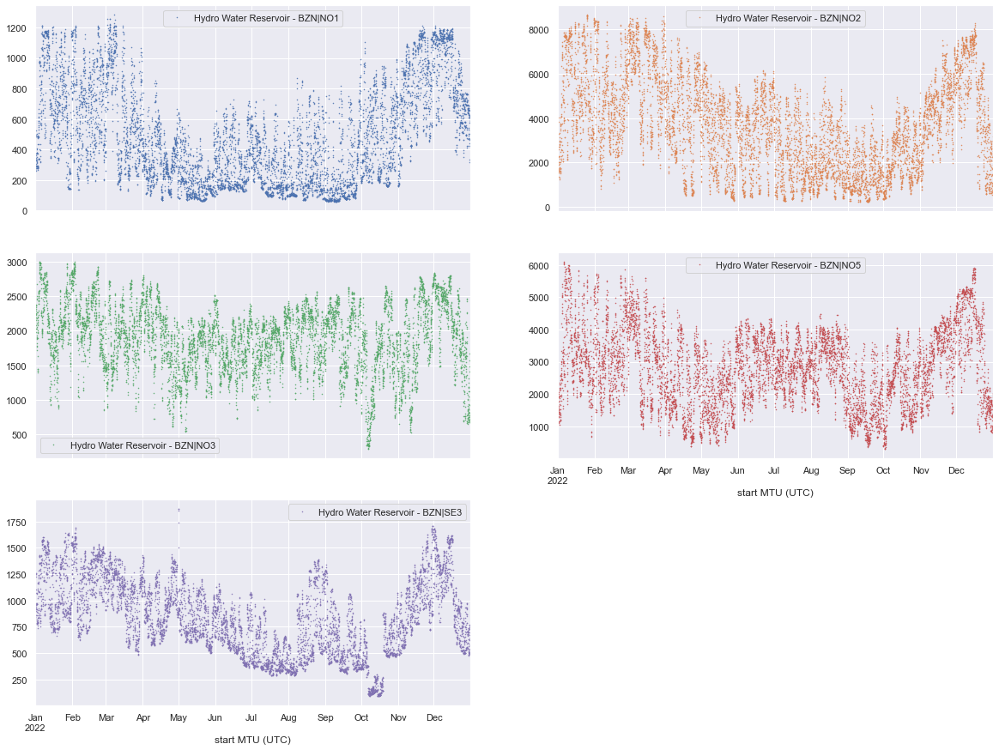

In [367]:
water_reservoir_columns.plot(lw=0, marker=".", subplots=True, layout=(-1, 2),
                             figsize=(20, 15), markersize=1);

#### Feature distribution Water Reservoir Category

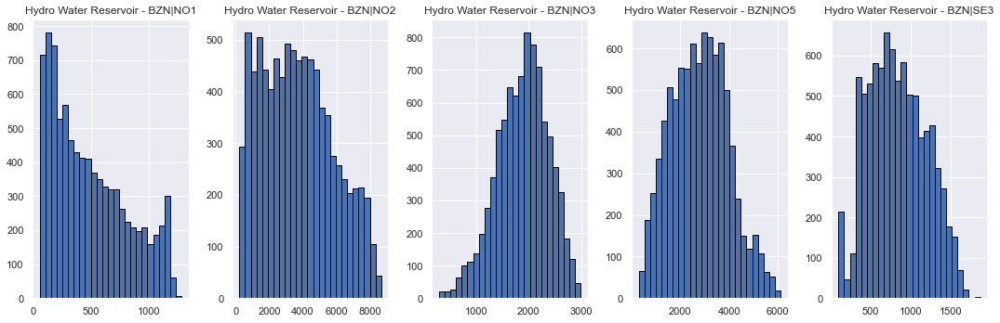

In [368]:
water_reservoir_columns.hist(bins=25, figsize=(15, 5), layout=(-1, 5), edgecolor="black")
plt.tight_layout();

####  Feature Correlation Water Reservoir Category

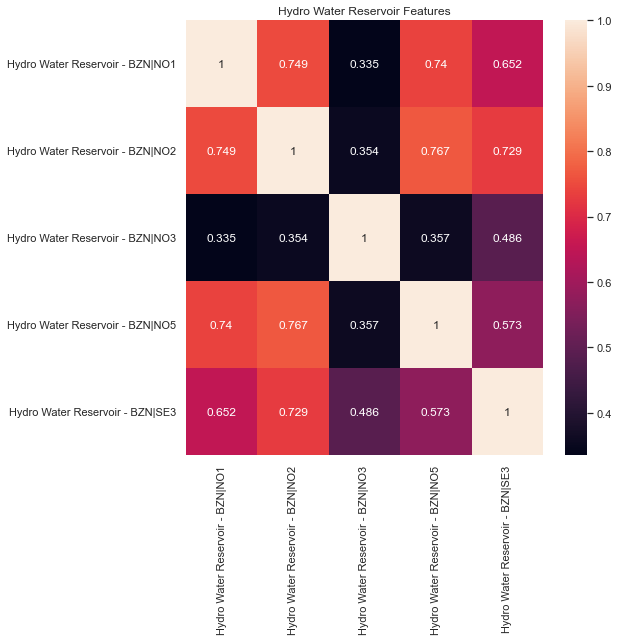

In [369]:
plt.figure(figsize=(8, 8))
df_corr = water_reservoir_columns.corr()
sns.heatmap(df_corr, annot=True, fmt='.3g')
plt.title("Hydro Water Reservoir Features")
plt.show()

### Electrivity genration per unit Category

In [370]:
# Generation per unit type category with 174 missing values
## sone5 no wind, sone SE3 no waaste and only with nuclear
generation_names = [

                    'Hydro Run-of-river and poundage - BZN|NO1', 'Hydro Run-of-river and poundage - BZN|NO2', 'Hydro Run-of-river and poundage - BZN|NO3', 'Hydro Run-of-river and poundage - BZN|NO5',

                    'Wind Onshore - BZN|NO1', 'Wind Onshore - BZN|NO2', 'Wind Onshore - BZN|NO3', 'Wind Onshore - BZN|SE3', 'Waste - BZN|NO1', 'Waste - BZN|NO2', 'Waste - BZN|NO3',
                    'Waste - BZN|NO5',  'Solar - BZN|SE3', 'Nuclear - BZN|SE3', 'Other - BZN|SE3',

                    'Hydro Pumped Storage Aggregated- BZN|NO2', 'Hydro Pumped Storage Aggregated- BZN|NO3', 'Hydro Pumped Storage Aggregated- BZN|NO5',
                    'Other renewable - BZN|NO3',

                    'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1', 'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2', 'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3', 'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5', 'Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3'
                    ]
generation_columns = df_2022[generation_names]

# Counts total NaN in Generation_columns = 174
generation_columns.isnull().sum().sum()
generation_columns.isna().sum()



Hydro Run-of-river and poundage - BZN|NO1                  0
Hydro Run-of-river and poundage - BZN|NO2                  0
Hydro Run-of-river and poundage - BZN|NO3                  0
Hydro Run-of-river and poundage - BZN|NO5                  0
Wind Onshore - BZN|NO1                                     0
Wind Onshore - BZN|NO2                                     0
Wind Onshore - BZN|NO3                                     0
Wind Onshore - BZN|SE3                                     1
Waste - BZN|NO1                                            0
Waste - BZN|NO2                                            0
Waste - BZN|NO3                                            0
Waste - BZN|NO5                                            0
Solar - BZN|SE3                                            1
Nuclear - BZN|SE3                                          1
Other - BZN|SE3                                            1
Hydro Pumped Storage Aggregated- BZN|NO2                   0
Hydro Pumped Storage Agg

In [371]:
generation_columns.describe()

,Hydro Run-of-river and poundage - BZN|NO1,Hydro Run-of-river and poundage - BZN|NO2,Hydro Run-of-river and poundage - BZN|NO3,Hydro Run-of-river and poundage - BZN|NO5,Wind Onshore - BZN|NO1,Wind Onshore - BZN|NO2,Wind Onshore - BZN|NO3,Wind Onshore - BZN|SE3,Waste - BZN|NO1,Waste - BZN|NO2,...,Other - BZN|SE3,Hydro Pumped Storage Aggregated- BZN|NO2,Hydro Pumped Storage Aggregated- BZN|NO3,Hydro Pumped Storage Aggregated- BZN|NO5,Other renewable - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO1,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO2,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO3,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|NO5,Water Reservoirs & Hydro Storage Plants [MWh] - BZN|SE3
count,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8760.000000,8759.000000,8760.000000,8760.000000,...,8759.000000,8760.000000,8760.000000,8760.000000,8760.000000,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03,8.760000e+03
mean,1209.284247,555.648858,537.426598,248.444178,94.691210,550.605594,748.882648,971.454846,4.715411,6.248630,...,652.897705,83.147032,24.604909,68.931507,12.863242,3.104524e+06,1.553699e+07,5.547357e+06,8.777882e+06,1.437907e+06
std,311.740760,207.884296,244.993969,151.873297,79.292481,397.487945,499.317320,686.052356,2.390364,3.345065,...,335.205115,123.715453,19.546460,89.022583,5.277981,1.519288e+06,5.390880e+06,2.081847e+06,4.407063e+06,2.752389e+05
min,591.000000,169.000000,144.000000,17.000000,0.000000,1.000000,9.000000,35.000000,0.000000,0.000000,...,136.000000,0.000000,0.000000,0.000000,0.000000,4.853340e+05,6.334677e+06,1.844130e+06,1.624537e+06,8.330000e+05
25%,976.000000,379.000000,319.000000,126.000000,28.000000,193.000000,312.000000,409.000000,3.000000,4.000000,...,333.000000,1.000000,0.000000,0.000000,11.000000,1.812166e+06,1.167022e+07,3.909162e+06,4.719615e+06,1.268000e+06
50%,1140.000000,555.000000,501.000000,203.000000,75.000000,472.500000,633.000000,832.000000,4.000000,5.000000,...,621.000000,1.000000,27.500000,33.000000,12.000000,3.900786e+06,1.621454e+07,5.665552e+06,9.428249e+06,1.546000e+06
75%,1468.000000,720.000000,717.250000,377.000000,151.000000,909.250000,1178.250000,1394.000000,6.000000,9.000000,...,937.000000,137.000000,45.000000,103.000000,14.000000,4.108040e+06,1.802379e+07,7.498030e+06,1.225761e+07,1.629000e+06
max,1895.000000,1146.000000,1095.000000,630.000000,355.000000,1337.000000,1997.000000,2945.000000,26.000000,16.000000,...,1463.000000,432.000000,49.000000,428.000000,25.000000,5.323211e+06,2.544908e+07,8.100718e+06,1.543183e+07,1.853000e+06


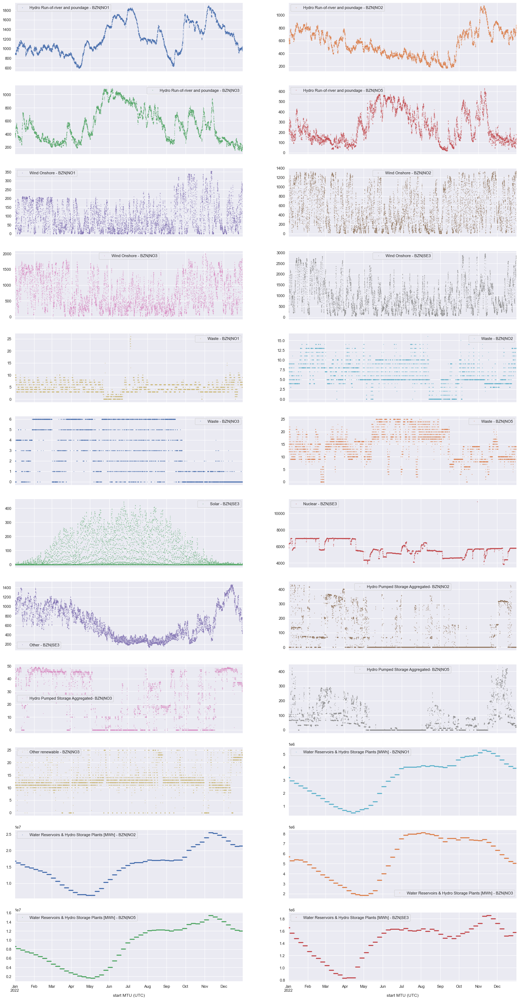

In [372]:
generation_columns.plot(lw=0, marker=".", subplots=True, layout=(-1, 2),
                        figsize=(25, 50), markersize=1);

#### Feature distribution  Electrivity genration per unit Category

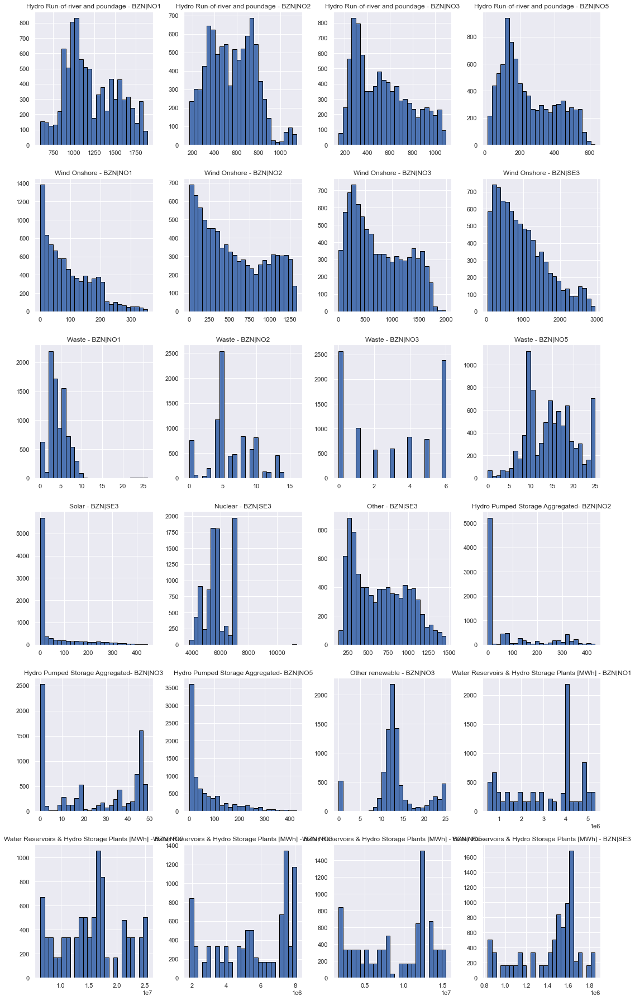

In [373]:
generation_columns.hist(bins=25, figsize=(15, 25), layout=(-1, 4), edgecolor="black")
plt.tight_layout();

#### Feature Correlation Electricity Generation Category

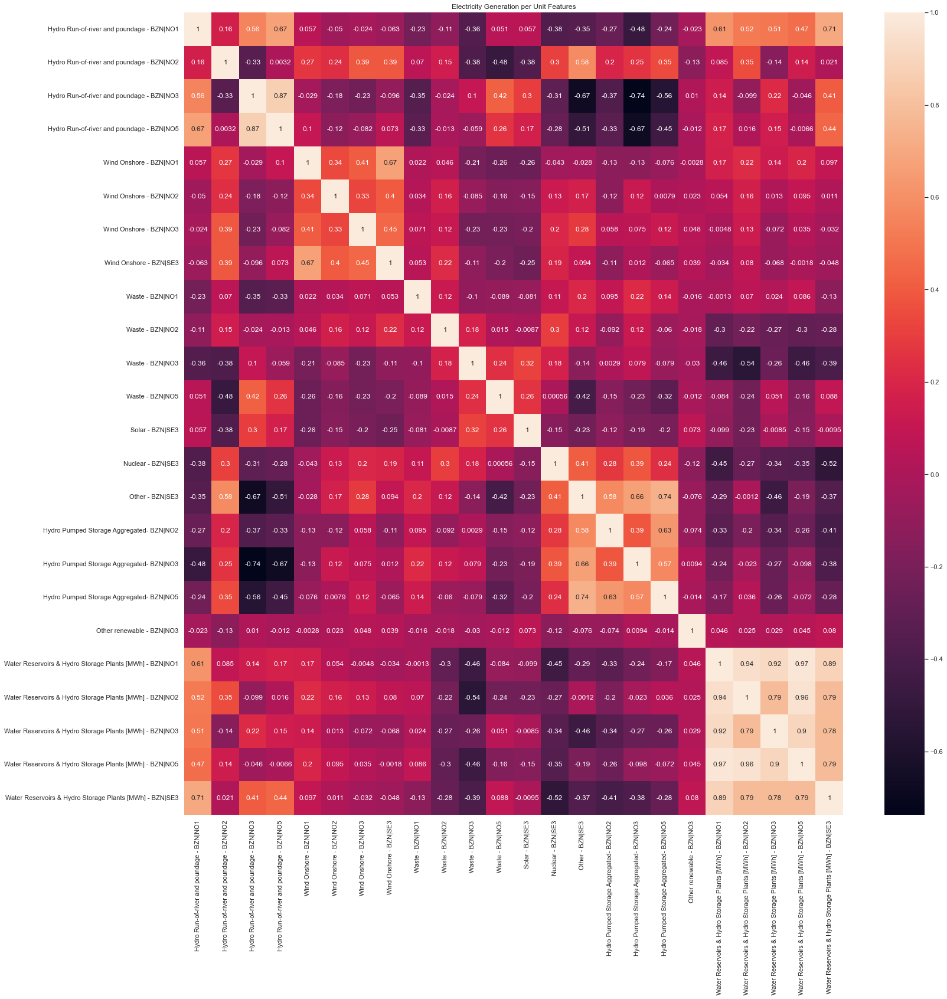

In [374]:
plt.figure(figsize=(25, 25))
df_corr = generation_columns.corr()
sns.heatmap(df_corr, annot=True, fmt='.2g')
plt.title("Electricity Generation per Unit Features")
plt.show()

## Feature selection

## Feature engineering